# Image Processing
# Vũ Đình Chương - 21127236

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import time
from PIL import Image

### Hàm hổ trợ xử lý 

In [3]:
def int2float_img(image):
    img = image.astype(float)
    img /= np.max(image)
    return img, np.max(image)

In [4]:
def float2int_img(image, img_max):
    return image * img_max

## Các hàm chức năng


### Thay đổi độ sáng cho ảnh

In [5]:
def imagebrightness(image):
    img, img_max = int2float_img(image)
    brightness = 10 / img_max
    brighter_img = img + brightness
    brighter_img = np.clip(brighter_img, 0, 1)
    return float2int_img(brighter_img, img_max)
    

### Thay đổi độ tương phản cho ảnh

In [6]:
def imagecontrast(image):
    img, img_max = int2float_img(image)
    contrast = 2
    contrast_img = img * contrast
    contrast_img = np.clip(contrast_img, 0, 1)
    return float2int_img(contrast_img, img_max)

### Lật ảnh ngang - dọc

In [7]:
def flip_image(image, mode):
    img, img_max = int2float_img(image)
    if mode == 'horizon':
        flip_image = img[::, ::-1]
    elif mode == 'vertical':
        flip_image = img[::-1]
    else:
        raise ValueError("Invalid mode: should be 'horizon' or 'vertical'")
    return float2int_img(flip_image, img_max)

### Chuyển đổi ảnh RGB thành xám

In [8]:
def rgb2gray(image):
    img, img_max = int2float_img(image)
    gray_filter = np.array([0.29, 0.59, 0.11])
    gray_img = np.dot(img[:, :, :3], gray_filter)
    gray_img = np.clip(gray_img, 0 , 1)
    return float2int_img(gray_img, img_max)

### Chuyển đổi ảnh RGB thành sepia

In [9]:
def rgb2sepia(image):
    img, img_max = int2float_img(image)
    sepia_filter = np.array([[.393, .769, .189],
                             [.349, .686, .168],
                             [.272, .534, .131]], dtype=float)
    sepia_img = np.dot(img, sepia_filter.T)
    sepia_img = np.clip(sepia_img, 0 , 1)
    return float2int_img(sepia_img, img_max)

### Hàm hổ trợ fftconvolution cho xử lý làm mờ ảnh và sắc nét ảnh

In [10]:
def fftconvolution(image, kernel):
    new_img = np.zeros_like(image)
    for i in range(image.shape[2]):
        new_img[:, :, i] = np.real(np.fft.ifft2(np.fft.fft2(image[:, :, i]) * np.fft.fft2(kernel, s=image[:, :, i].shape)))
    return new_img

### Làm mờ ảnh

In [11]:
def imageblur(image):
    img, img_max = int2float_img(image)
    gaussian_kernel = np.array([[1, 2, 1],[2, 4, 2],[1, 2, 1]],dtype=float) * 1/16
    blur_img = fftconvolution(img, gaussian_kernel)
    blur_img[0:3, :] = img[0:3, :]
    blur_img = np.clip(blur_img, 0, 1)
    return float2int_img(blur_img, img_max)

### Làm sắc nét ảnh

In [12]:
def imagesharpen(image):
    img, img_max = int2float_img(image)
    sharpen_kernel = np.array([[0, -1, 0],[-1, 5, -1],[0, -1, 0]], dtype=float)
    sharpen_img = fftconvolution(img, sharpen_kernel)
    sharpen_img[0:3, :] = img[0:3, :]
    sharpen_img[:, 0:2] = img[:, 0:2]
    sharpen_img = np.clip(sharpen_img, 0, 1)
    return float2int_img(sharpen_img, img_max)

### Cắt ảnh theo kích thước (cắt ở trung tâm)

In [13]:
def imagecrop(image):
    img, img_max = int2float_img(image)
    scale = 0.6
    height = image.shape[0]
    width = image.shape[1]
    size = int(min(height, width) * scale) 
    x = (width - size) // 2
    y = (height - size) // 2
   
    return float2int_img(img[y:y + size, x:x + size], img_max)
    

### Cắt ảnh theo khung hình tròn

In [14]:
def circle_image(image):
    img, img_max = int2float_img(image)
    height = int(image.shape[0])
    width = int(image.shape[1])
    x_center = width // 2
    y_center = height // 2
    x , y = np.ogrid[:width, :height]
    radius = min(x_center, y_center)
    mask = ((x - x_center) ** 2 + (y - y_center) ** 2) <= radius ** 2
    circle_img = np.zeros_like(img)
    circle_img[mask] = img[mask]
    return float2int_img(circle_img, img_max)

### Cắt ảnh theo khung 2 ellipse chéo nhau

In [15]:
def elips_image(image):
    img, img_max = int2float_img(image)
    height = int(image.shape[0])
    width = int(image.shape[1])
    x_center = width // 2
    y_center = height // 2
    x , y = np.ogrid[:width, :height]
    mask1 = ((x - x_center)  + (y - y_center)) ** 2 / (450 ** 2) + ((x - x_center) - (y - y_center)) ** 2 / (244.2 ** 2) <= 1
    mask2 = ((x - x_center)  + (y - y_center)) ** 2 / (244.2 ** 2) + ((x - x_center) - (y - y_center)) ** 2 / (450 ** 2) <= 1
    mask = mask1 | mask2
    elip_img = np.zeros_like(img)
    elip_img[mask] = img[mask]
    return float2int_img(elip_img, img_max)

## Các hàm hổ trợ xử lý

### Hàm nhập xuất ảnh

In [16]:
def importImage(path):
    img = Image.open(path)
    image = np.array(img)
    return image

In [17]:
def export_img(new_img, func):
    new_img = Image.fromarray(new_img.astype(np.uint8))
    output = 'output_' + str(func) + '.jpg'
    new_img.save(output) 

### Hàm show ảnh ra màn hình

In [18]:
def show_img(image, new_img, func1, another_img = None, func2 = None):
    if np.any(another_img) == None and func2 == None:
        fig, axs = plt.subplots(1, 2, figsize=(14, 7))
        
        axs[0].set_title("Original Image")
        axs[0].imshow(image)
        axs[0].axis('off')
        
        axs[1].set_title(func1 + " Image")
        axs[1].imshow(new_img, 'gray')
        axs[1].axis('off')
    
    else:
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))
        
        axs[0].set_title("Original Image")
        axs[0].imshow(image)
        axs[0].axis('off')
        
        axs[1].set_title(func1 + " Image")
        axs[1].imshow(new_img, 'gray')
        axs[1].axis('off')
        
        axs[2].set_title(func2 + " Image")
        axs[2].imshow(another_img, 'gray')
        axs[2].axis('off')
    
    plt.show()

### Hàm gọi các hàm xử lý ảnh và nhập xuẩt ảnh

In [19]:
def printImagebright(image):
    start = time.time()
    brighter_img = imagebrightness(image).astype(np.uint8)
    end = time.time() 
    print('Image brightness runtime:', end - start)
    show_img(image, brighter_img, 'Brighter')
    export_img(brighter_img, 'brighter')

In [20]:
def printImagecontrast(image):
    start = time.time()
    contrast_img = imagecontrast(image).astype(np.uint8)
    end = time.time() 
    print('Image to contrast runtime:', end - start)
    show_img(image, contrast_img, 'Contrast')
    export_img(contrast_img, 'contrast')

In [21]:
def printImageflip(image):
    start = time.time()
    flip_v_img = flip_image(image, 'vertical').astype(np.uint8) 
    flip_h_img = flip_image(image, 'horizon').astype(np.uint8) 
    end = time.time()
    print('Image flip runtime:', end - start)
    show_img(image, flip_v_img, f"Flip vertical", flip_h_img, f"Flip horizon" )
    export_img(flip_v_img, f"vertical_flip")
    export_img(flip_h_img, f"horizon_flip")

In [22]:
def printImage2gray(image):
    start = time.time()
    image2gray = rgb2gray(image)
    end = time.time() 
    print('Image to gray runtime:', end - start)
    show_img(image, image2gray, 'Gray')
    export_img(image2gray, 'gray')

In [23]:
def printImage2sepia(image):
    start = time.time()
    image2sepia = rgb2sepia(image).astype(np.uint8)
    end = time.time() 
    print('Image to sepia runtime:', end - start)
    show_img(image, image2sepia, 'Sepia')
    export_img(image2sepia, 'sepia')

In [24]:
def printImageblur(image):
    start = time.time()
    blur_img = imageblur(image).astype(np.uint8)
    end = time.time()
    print('Image blur runtime:', end - start)
    show_img(image, blur_img, 'Blur')
    export_img(blur_img, 'blur')

In [25]:
def printImageSharpen(image):
    blur_img = imageblur(image).astype(np.uint8)
    start = time.time()
    sharpen_img = imagesharpen(blur_img).astype(np.uint8)
    end = time.time()
    print('Image sharpen runtime:', end - start)
    show_img(image, blur_img, 'Blur', sharpen_img, 'Sharpen')
    export_img(sharpen_img, 'sharpen')

In [26]:
def printImagcrop(image):
    start = time.time()
    crop_img = imagecrop(image).astype(np.uint8)
    end = time.time()
    print('Image crop runtime:', end - start)
    show_img(image, crop_img, 'Crop')
    export_img(crop_img, 'crop')

In [27]:
def printImagecircle(image):
    start = time.time()
    circle_img = circle_image(image).astype(np.uint8)
    end = time.time()
    print('Image to circle runtime:', end - start)
    show_img(image, circle_img, 'Circle')
    export_img(circle_img, 'circle')

In [28]:
def printImagelips(image):
    start = time.time()
    elips_img = elips_image(image).astype(np.uint8) 
    end = time.time()
    print('Image to 2 ellipses runtime:', end - start)
    show_img(image, elips_img, 'Elips')
    export_img(elips_img, 'elips')

### Hàm in ra các lựa chọn

In [29]:
def choices():
    print("0. All choices below")
    print("1. Change image brightness")
    print("2. Change image contrast")
    print("3. Flip image")
    print("4. Change from RGB to gray/sepia color")
    print("5. Blur and sharpen the blur image")
    print("6. Center crop the image")
    print("7. Change the image to circle")
    print("8. Change the image to 2 ellipses overlap")

### Hàm xử lý lựa chọn chức năng

In [30]:
def processing(choice, image):
    if(choice == '0'):
        printImagebright(image)
        printImagecontrast(image)
        printImageflip(image)
        printImage2gray(image)
        printImage2sepia(image)
        printImageblur(image)
        printImageSharpen(image)
        printImagcrop(image)
        printImagecircle(image)
        printImagelips(image)
    elif(choice == '1'):
        printImagebright(image)
    elif(choice == '2'):
        printImagecontrast(image)
    elif(choice == '3'):
        printImageflip(image)
    elif(choice == '4'):
        printImage2gray(image)
        printImage2sepia(image)
    elif(choice == '5'):
        printImageblur(iamge)
        printImageSharpen(image)
    elif(choice == '6'):
        printImagcrop(image)
    elif(choice == '7'):
        printImagecircle(image)
    elif(choice == '8'):
        printImagelips(image)
    else:
        print('Invalid option')


### hàm main thực hiện chương trình

In [31]:
def main():
    image_path = input("Enter the image's name: ")
    image = importImage(image_path)
    choices()
    choice = input("Enter your choice:")
    processing(choice, image)
    

0. All choices below
1. Change image brightness
2. Change image contrast
3. Flip image
4. Change from RGB to gray/sepia color
5. Blur and sharpen the blur image
6. Center crop the image
7. Change the image to circle
8. Change the image to 2 ellipses overlap
Image brightness runtime: 0.013962984085083008


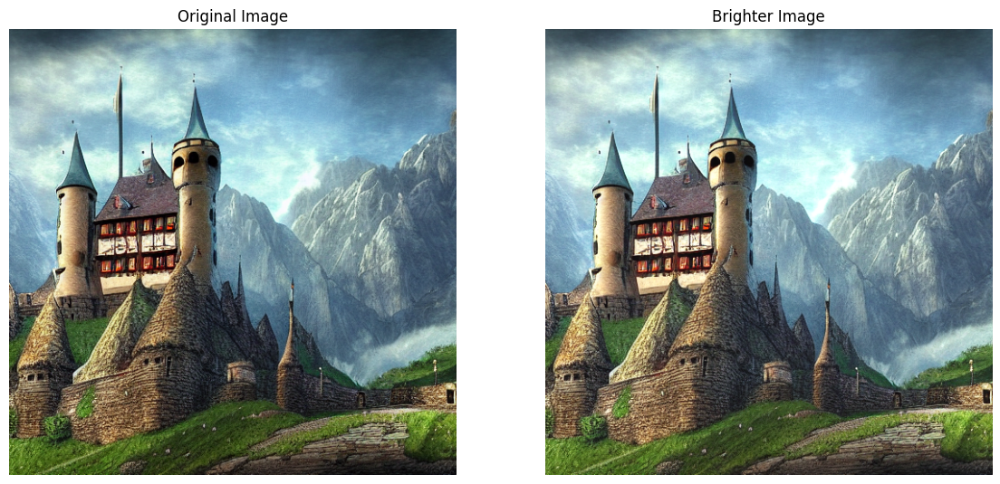

Image to contrast runtime: 0.010012149810791016


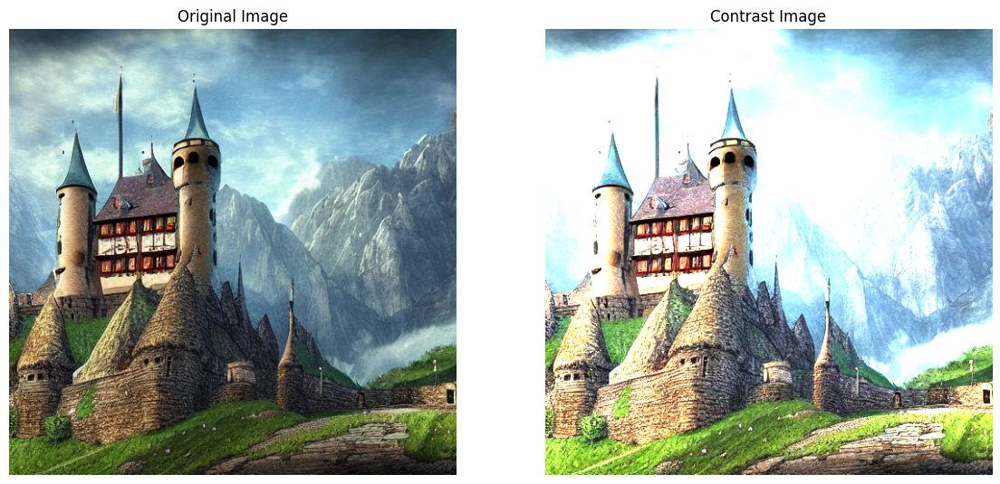

Image flip runtime: 0.015958070755004883


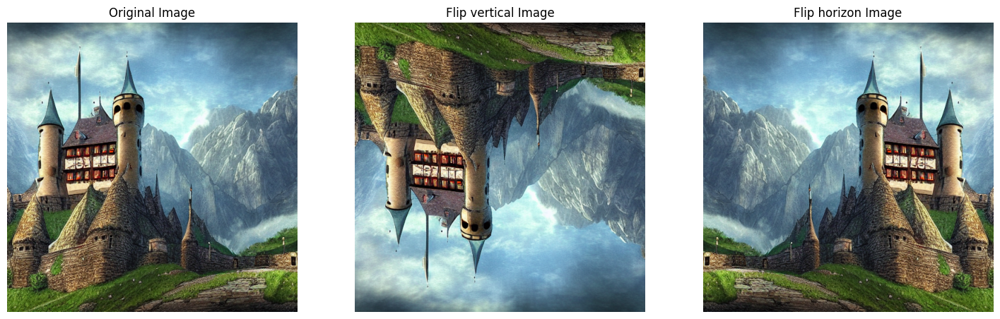

Image to gray runtime: 0.01296544075012207


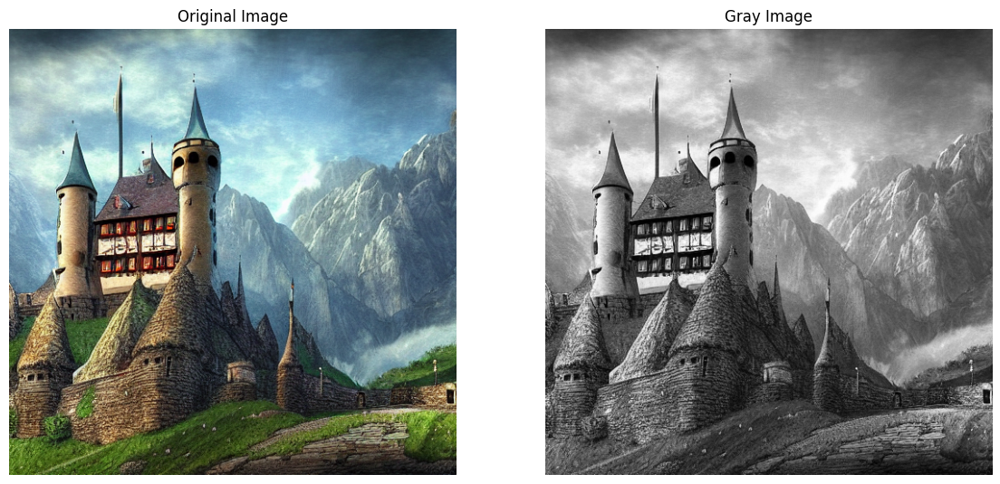

Image to sepia runtime: 0.06482458114624023


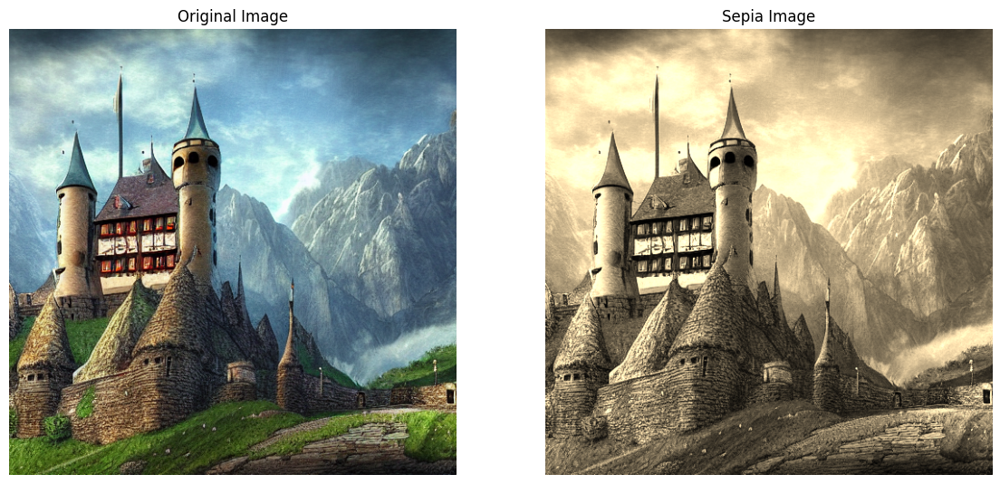

Image blur runtime: 0.1266646385192871


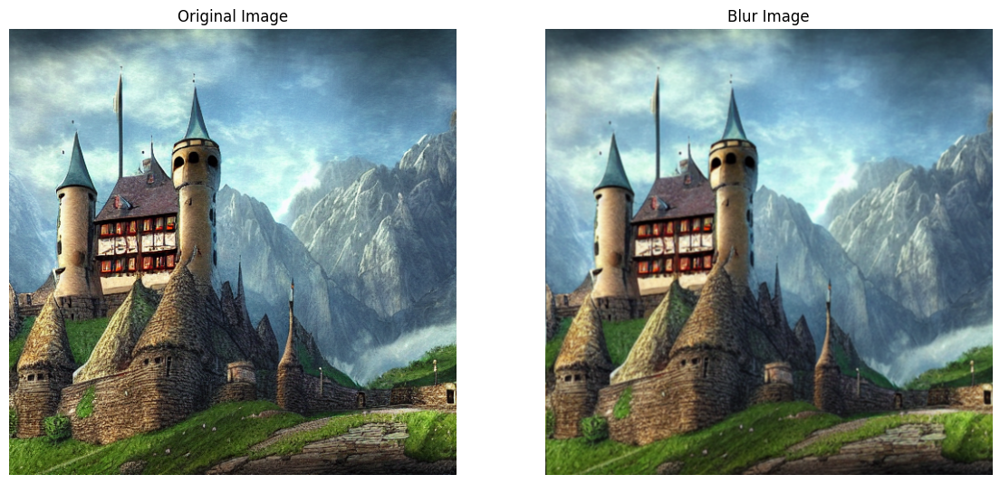

Image sharpen runtime: 0.12466835975646973


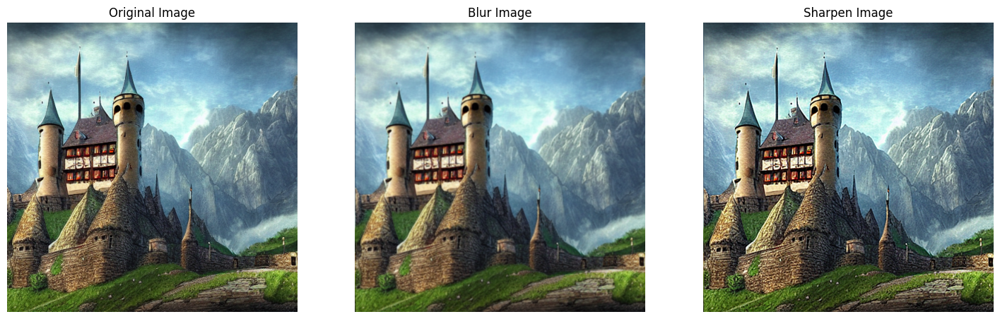

Image crop runtime: 0.0039899349212646484


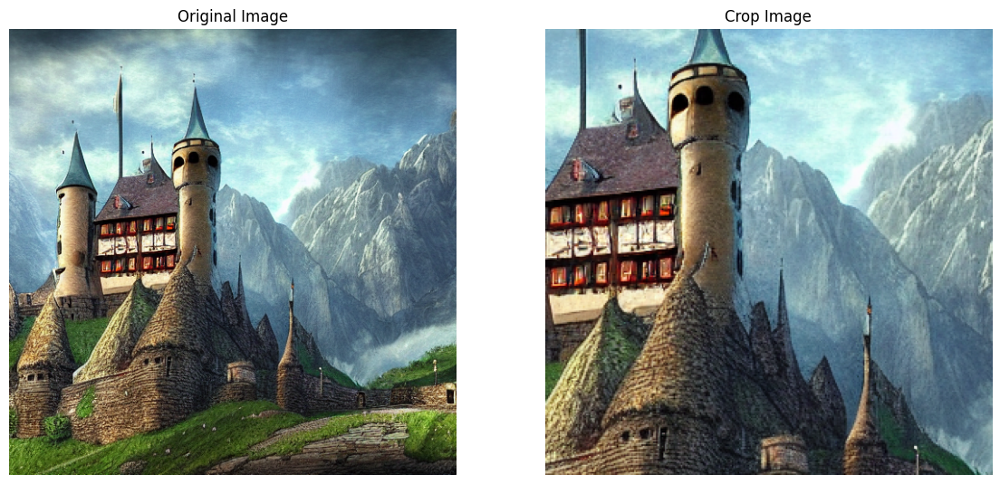

Image to circle runtime: 0.025930166244506836


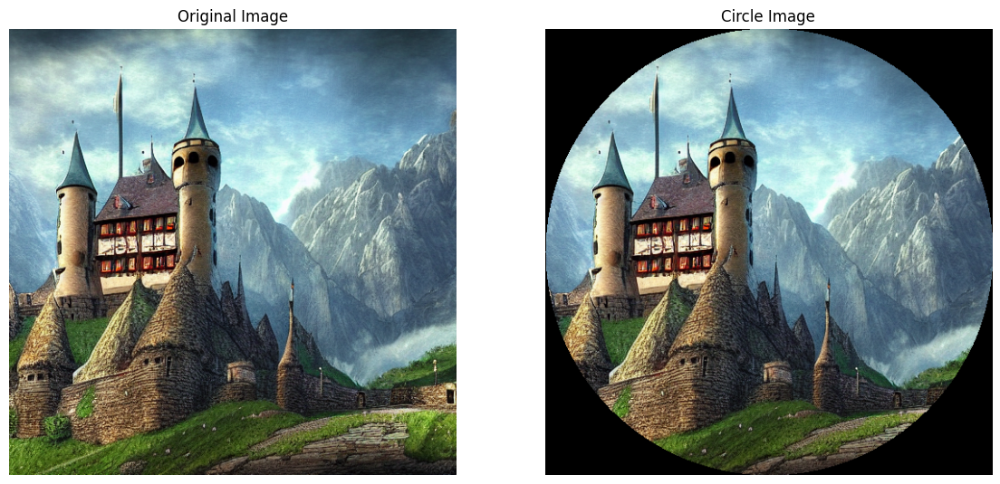

Image to 2 ellipses runtime: 0.03490757942199707


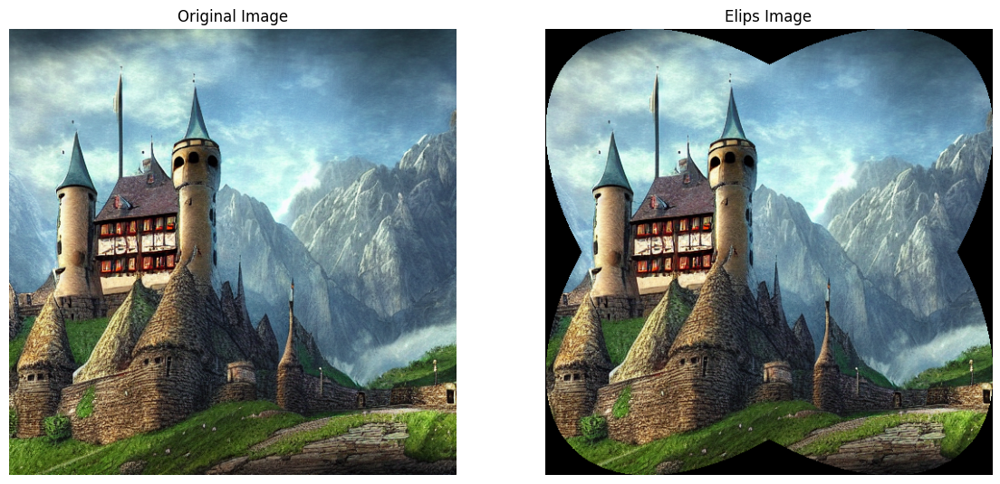

In [32]:
if __name__ == "__main__":
    main()